Autoreload modules while developing.

In [1]:
%load_ext autoreload
%autoreload 2

# Subspace Digital Twin, Sweep Credit Supply

* Shawn Anderson, December 2023*

In this notebook, we explore a test sweep over three credit supply definitions. These are: supply_issued, supply_earned, and supply_earned_minus_burned.

In [2]:
import pandas as pd
import hvplot.pandas
import plotly.io as pio
from holoviews import opts
import holoviews as hv
import plotly.express as px
hvplot.extension('plotly')
pio.renderers.default = "png" # For GitHub rendering

import sys
sys.path.append('../')

from subspace_model.experiments.charts import ab_block_utilization


2024-01-30 16:37:01 - subspace-digital-twin - INFO
------------subspace-digital-twin------------


### Part 1. Load Data:  Sweep-Credit-Supply

Load simulation data and set index to `days_passed`, backfill (for initial timesteps) and replace nan with 0.

In [3]:
df = pd.read_pickle('../data/simulations/sweep_credit_supply-2023-12-21_22-37-37.pkl.gz').set_index('days_passed').bfill().fillna(0)
df.head()

,blocks_passed,circulating_supply,user_supply,issued_supply,sum_of_stocks,block_utilization,dsf_relative_disbursal_per_day,reward_issuance_balance,other_issuance_balance,operators_balance,...,run,timestep,delta_days,delta_blocks,average_compute_weight_per_budle,label,environmental_label,timestep_in_days,block_time_in_seconds,max_credit_supply
days_passed,,,,,,,,,,,,,,,,,,,,,
0,0.0,0.000000,0.000000,0.000000e+00,0.000000e+00,0.0,0.0,1.320000e+09,1.680000e+09,0.000000,...,1,0,1.0,14400.0,1.000000e+10,supply-issued,constant-utilization,1,6,3000000000
1,14400.0,13.698630,13.698630,1.680000e+09,3.000000e+09,0.5,0.0,1.320000e+09,1.680000e+09,0.000000,...,1,1,1.0,14400.0,1.000000e+10,supply-issued,constant-utilization,1,6,3000000000
2,28800.0,27.363014,27.363014,1.680000e+09,3.000000e+09,0.5,0.0,1.320000e+09,1.680000e+09,0.000000,...,1,2,1.0,14400.0,1.000000e+10,supply-issued,constant-utilization,1,6,3000000000
3,43200.0,49.305238,49.305238,1.680000e+09,3.000000e+09,0.5,0.0,1.320000e+09,1.680000e+09,0.000000,...,1,3,1.0,14400.0,1.000000e+10,supply-issued,constant-utilization,1,6,3000000000
4,57600.0,71.192607,71.192607,1.680000e+09,3.000000e+09,0.5,0.0,1.320000e+09,1.680000e+09,0.002771,...,1,4,1.0,14400.0,1.000000e+10,supply-issued,constant-utilization,1,6,3000000000


In [4]:
df.shape

(4212, 47)

### AB Test Block Utilization

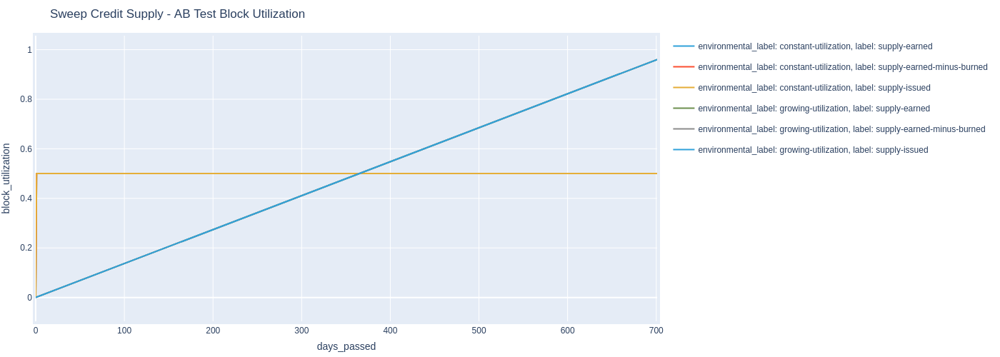

In [5]:
fig = ab_block_utilization(df.reset_index(), experiment='Sweep Credit Supply')
pio.show(fig)

In [6]:
fig.write_image('test.png')

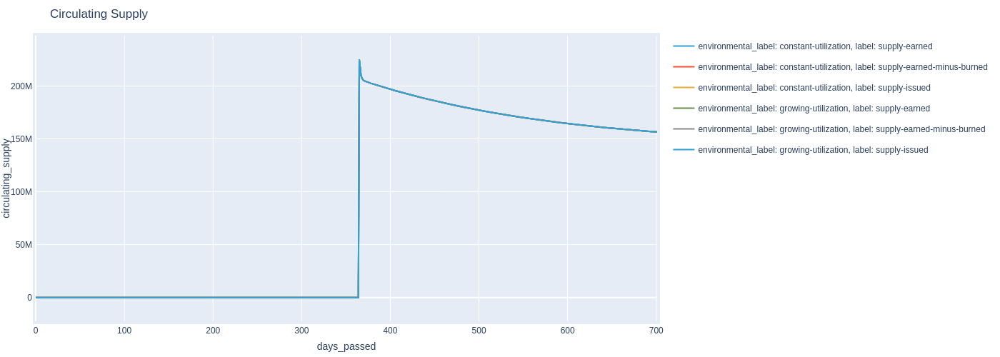

In [7]:
chart = df.hvplot.line(x='days_passed', y='circulating_supply', by=['environmental_label','label'], title='Circulating Supply', height=500, width=1400)
pio.show(hv.render(chart, backend='plotly'))

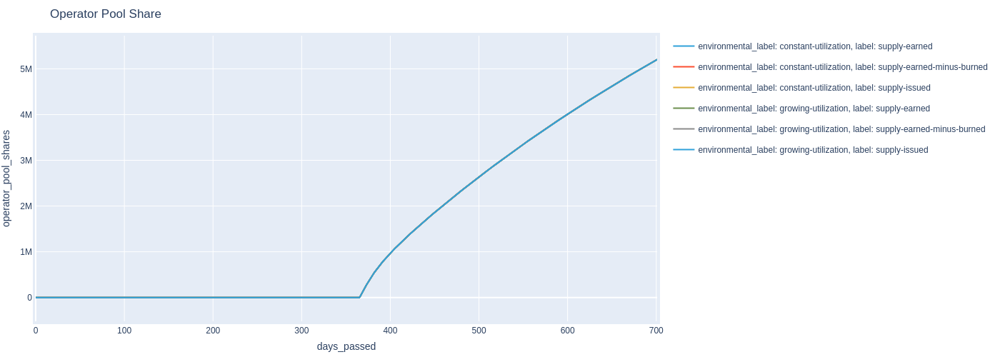

In [8]:
chart = df.hvplot.line(x='days_passed', y='operator_pool_shares', by=['environmental_label','label'], title='Operator Pool Share', height=500, width=1400)
pio.show(hv.render(chart, backend='plotly'))

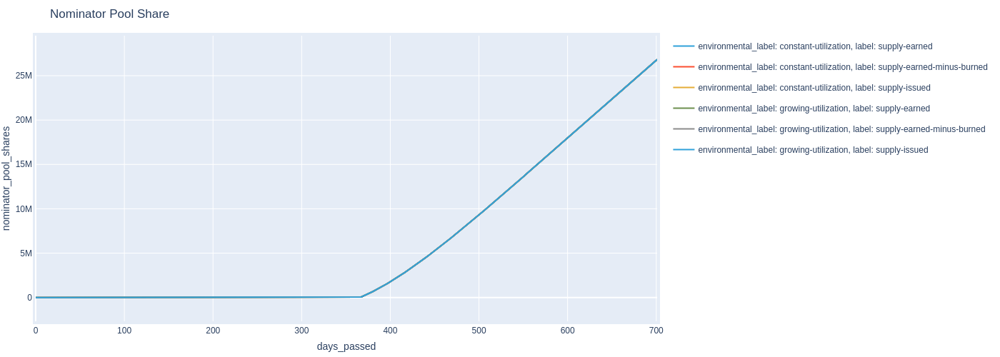

In [9]:
chart = df.hvplot.line(x='days_passed', y='nominator_pool_shares', by=['environmental_label','label'], title='Nominator Pool Share', height=500, width=1400)
pio.show(hv.render(chart, backend='plotly'))

Create a normalized version of the simulation data for exploring the results. This will allow us to see all stocks in the range of 0-1.

In [10]:
# Take numeric columns for normalizationn
df_numeric = df.select_dtypes(include=['number'])

# Create the normalized results
df_normalized = df_numeric / df_numeric.max()

# Add the label column back
df_normalized[['label', 'environmental_label']] = df[['label', 'environmental_label']]

# Drop unecessary columns
df_normalized = df_normalized.drop(['run', 'timestep', 'simulation', 'subset', 'timestep_in_days', 'block_time_in_seconds', 'sum_of_stocks', 'buffer_size'], axis=1)
df_normalized.shape

(4212, 39)

Groupby Label

In [11]:
df_normalized.hvplot.line(x='days_passed', groupby='label', by='environmental_label')

:DynamicMap   [label]
   :NdOverlay   [Variable]
      :Curve   [days_passed]   (value)

Groupby Environmental Label

In [12]:
df_normalized.hvplot.line(x='days_passed', groupby='environmental_label', by='label')

:DynamicMap   [environmental_label]
   :NdOverlay   [Variable]
      :Curve   [days_passed]   (value)

Isolate columns that differ over the parameter sets.

In [13]:
# Group by 'days_past` to see if there is variation across labels per day
differing_values = df_normalized.groupby('days_passed').nunique()

# Take columns that have any day where values are varied across labels.
df_differing_columns = df_normalized[list(differing_values.columns[differing_values.gt(1).any()])].reset_index()
df_differing_columns.shape

(4212, 22)

Group by label. Each label represents a parameter set for AB testing.

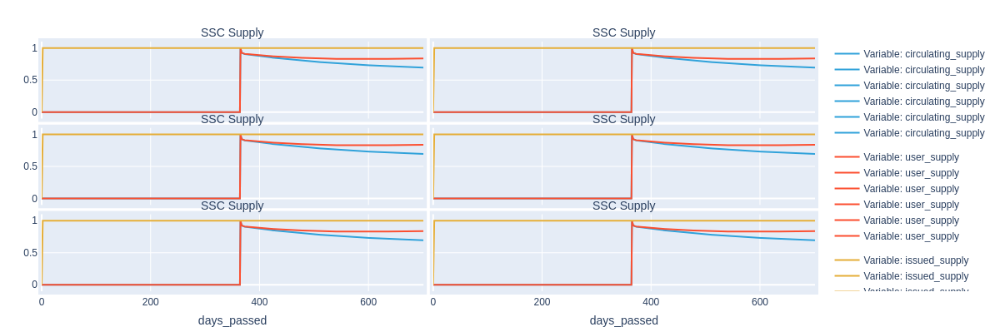

In [14]:
chart = df_differing_columns.reset_index().hvplot(
    x="days_passed", 
    y=[col for col in df_differing_columns.columns if "supply" in col],
    width=1000, height=500, row='label',col='environmental_label', title='SSC Supply')

pio.show(hv.render(chart, backend='plotly'))

In [15]:
labels = list(df_differing_columns['label'].unique())


In [16]:
labels

['supply-issued', 'supply-earned', 'supply-earned-minus-burned']

In [17]:
environmental_labels = list(df_differing_columns['environmental_label'].unique())
environmental_labels

['constant-utilization', 'growing-utilization']

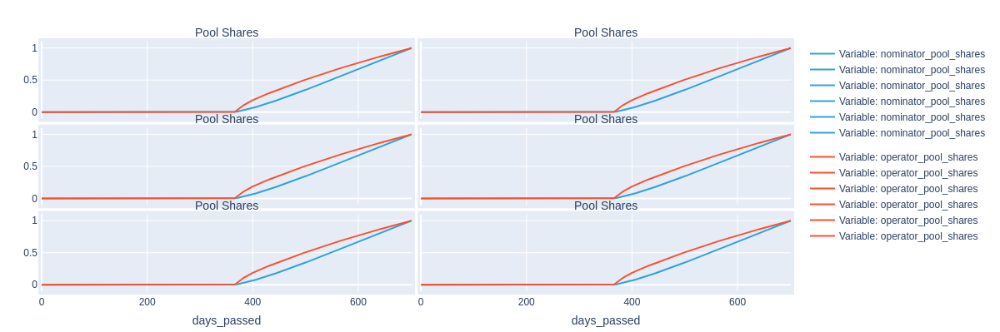

In [18]:
chart = df_differing_columns.reset_index().hvplot(
    x="days_passed", 
    y=[col for col in df_differing_columns.columns if "shares" in col],
    width=1000, height=500, row='label',col='environmental_label', title='Pool Shares')

pio.show(hv.render(chart, backend='plotly'))

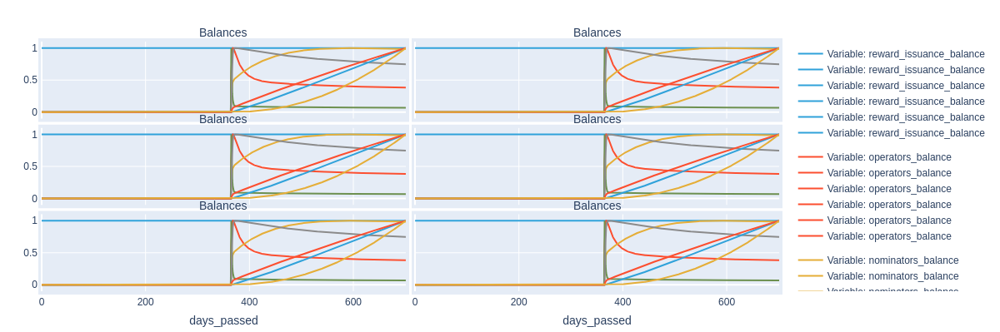

In [19]:
chart = df_differing_columns.reset_index().hvplot(
    x="days_passed", 
    y=[col for col in df_differing_columns.columns if "_balance" in col],
    width=1000, height=500, row='label',col='environmental_label', title='Balances')

pio.show(hv.render(chart, backend='plotly'))

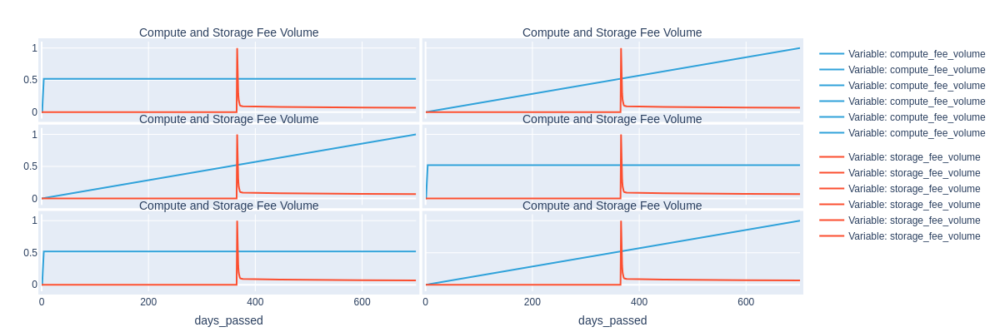

In [20]:
chart = df_differing_columns.reset_index().hvplot(
    x="days_passed", 
    y=[col for col in df_differing_columns.columns if "volume" in col],
    width=1000, height=500, row='label',col='environmental_label', title='Compute and Storage Fee Volume')

pio.show(hv.render(chart, backend='plotly'))

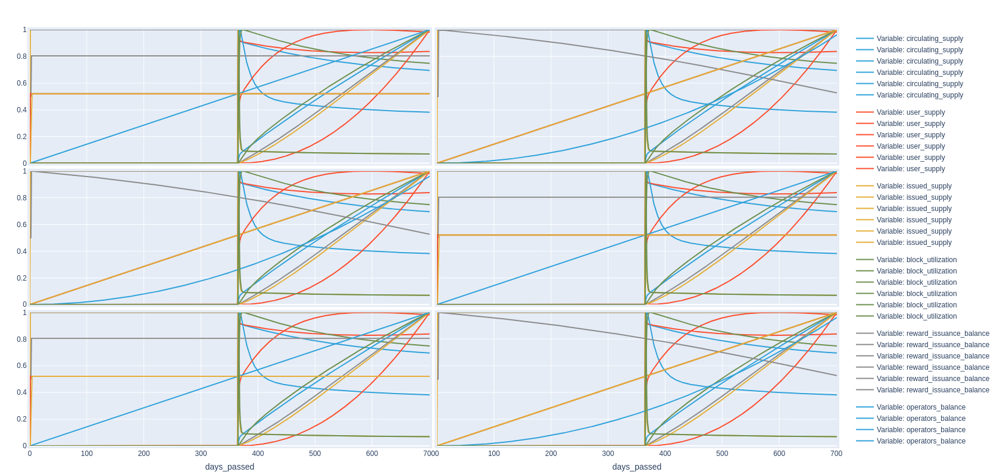

In [21]:
chart = df_differing_columns.hvplot(x='days_passed', row='label', col='environmental_label', height=1000, width=1400, ylim=(0,1))
pio.show(hv.render(chart, backend='plotly'))

Create a long form dataframe.

In [22]:
long_df = df_differing_columns.reset_index().melt(id_vars=['days_passed', 'label', 'environmental_label'], var_name='State', value_name='Value')
long_df

,days_passed,label,environmental_label,State,Value
0,0,supply-issued,constant-utilization,index,0.000000
1,1,supply-issued,constant-utilization,index,1.000000
2,2,supply-issued,constant-utilization,index,2.000000
3,3,supply-issued,constant-utilization,index,3.000000
4,4,supply-issued,constant-utilization,index,4.000000
...,...,...,...,...,...
84235,697,supply-earned-minus-burned,growing-utilization,storage_fee_volume,0.069167
84236,698,supply-earned-minus-burned,growing-utilization,storage_fee_volume,0.069142
84237,699,supply-earned-minus-burned,growing-utilization,storage_fee_volume,0.069116
84238,700,supply-earned-minus-burned,growing-utilization,storage_fee_volume,0.069091


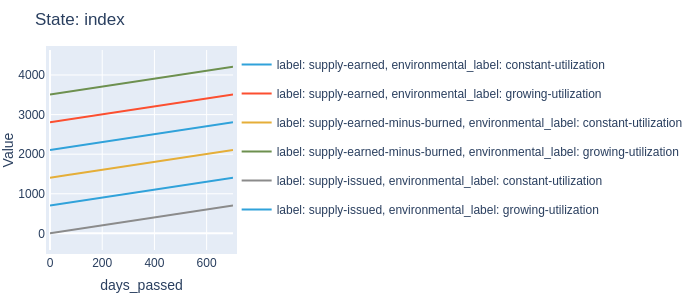

In [23]:
chart = long_df.hvplot.line(
    x='days_passed', 
    y='Value', 
    by=['label', 'environmental_label'], 
    groupby='State',
)
pio.show(hv.render(chart, backend='plotly'))

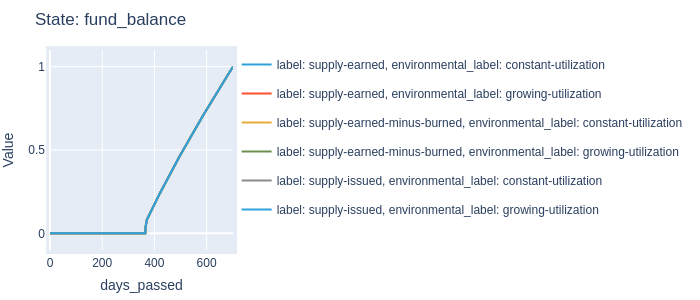

In [24]:
chart = long_df[long_df['State'].isin(['fund_balance', 'storage_fee_volume', 'block_reward'])].hvplot(x='days_passed', y='Value', groupby='State', by=['label', 'environmental_label'])
pio.show(hv.render(chart, backend='plotly'))

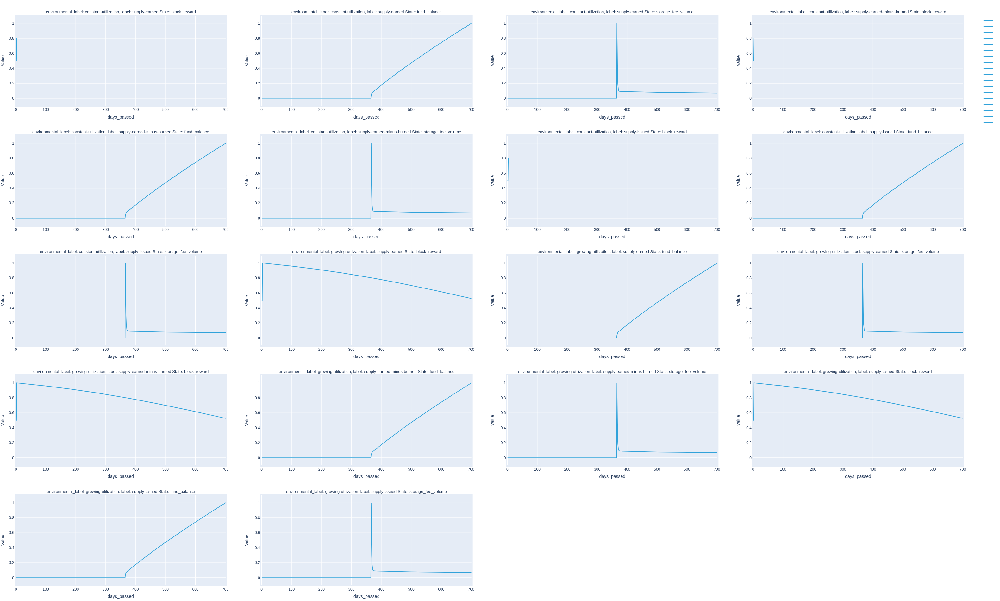

In [25]:
chart = long_df[long_df['State'].isin(['fund_balance', 'storage_fee_volume', 'block_reward'])].hvplot(x='days_passed', y='Value',  by=['environmental_label','label', 'State'], subplots=True)
pio.show(hv.render(chart, backend='plotly'))

In [26]:
y = ['circulating_supply', 'user_supply', 'issued_supply', 'staking_pool_balance', 'fund_balance', 'burnt_balance', 'reward_issuance_balance', 'farmers_balance', 'holders_balance', 'storage_fee_volume', 'space_pledged', 'history_size', 'replication_factor']

In [27]:
long_df[long_df['State'].isin(y)]

,days_passed,label,environmental_label,State,Value
4212,0,supply-issued,constant-utilization,circulating_supply,0.000000e+00
4213,1,supply-issued,constant-utilization,circulating_supply,6.088169e-08
4214,2,supply-issued,constant-utilization,circulating_supply,1.216112e-07
4215,3,supply-issued,constant-utilization,circulating_supply,2.191304e-07
4216,4,supply-issued,constant-utilization,circulating_supply,3.164058e-07
...,...,...,...,...,...
84235,697,supply-earned-minus-burned,growing-utilization,storage_fee_volume,6.916701e-02
84236,698,supply-earned-minus-burned,growing-utilization,storage_fee_volume,6.914165e-02
84237,699,supply-earned-minus-burned,growing-utilization,storage_fee_volume,6.911642e-02
84238,700,supply-earned-minus-burned,growing-utilization,storage_fee_volume,6.909132e-02


In [28]:
hvplot.extension('bokeh')
def plot_column(df: pd.DataFrame, column: str):
    df = df.reset_index().groupby(['environmental_label', 'label', 'days_passed']).mean().reset_index()
    chart = df.hvplot.line(y=column, by=['environmental_label', 'label'], x='days_passed', alpha=0.8, line_width=4, height=200, width=900)
    return chart

In [29]:
charts_dict = {column: plot_column(df_differing_columns, column) for column in df_differing_columns.columns}

In [30]:
holomap = hv.HoloMap(charts_dict)
grid = hv.GridSpace(holomap)
layout = hv.NdLayout(grid)
layout = layout.cols(2)
layout

:NdLayout   [Default]
   :NdOverlay   [environmental_label,label]
      :Curve   [days_passed]   (user_supply)

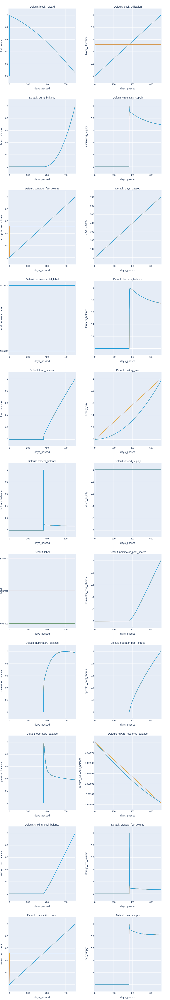

In [31]:
pio.show(hv.render(layout, backend='plotly'))